In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns


import plotly.graph_objects as go
import plotly.express as px

%matplotlib inline

In [2]:
data_df = pd.read_csv('fire_archive_V1_96617.csv') 

In [3]:
data_df.head(5)

,latitude,longitude,bright_ti4,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_ti5,frp,type
0,-34.45902,150.88040,326.5,0.60,0.71,2019-08-01,246,N,VIIRS,n,1,290.7,5.8,3
1,-31.70724,151.07191,367.0,0.56,0.69,2019-08-01,247,N,VIIRS,h,1,291.9,10.4,0
2,-31.39626,149.65253,325.2,0.68,0.74,2019-08-01,247,N,VIIRS,n,1,292.7,5.6,0
3,-30.39774,152.06432,347.8,0.48,0.65,2019-08-01,247,N,VIIRS,n,1,287.6,9.1,0
4,-31.20248,151.89766,350.7,0.50,0.66,2019-08-01,247,N,VIIRS,n,1,292.3,9.4,0


In [4]:
data_df.shape

(184778, 14)

# Task 1

### Ploting Density of brightness

1.1 Plot the longitude vs latitude several ways within a single figure (each in its own axes):
1) Using the matplotlib defaults.
2) Adjusting alpha and marker size to compensate for overplotting.
3) Using a hexbin plot.
4) Subsampling the dataset.
For each but the first one, ensure that all the plotting area is used in a reasonable way and that
as much information as possible is conveyed; this is somewhat subjective and there is no one
right answer. [45 pts]

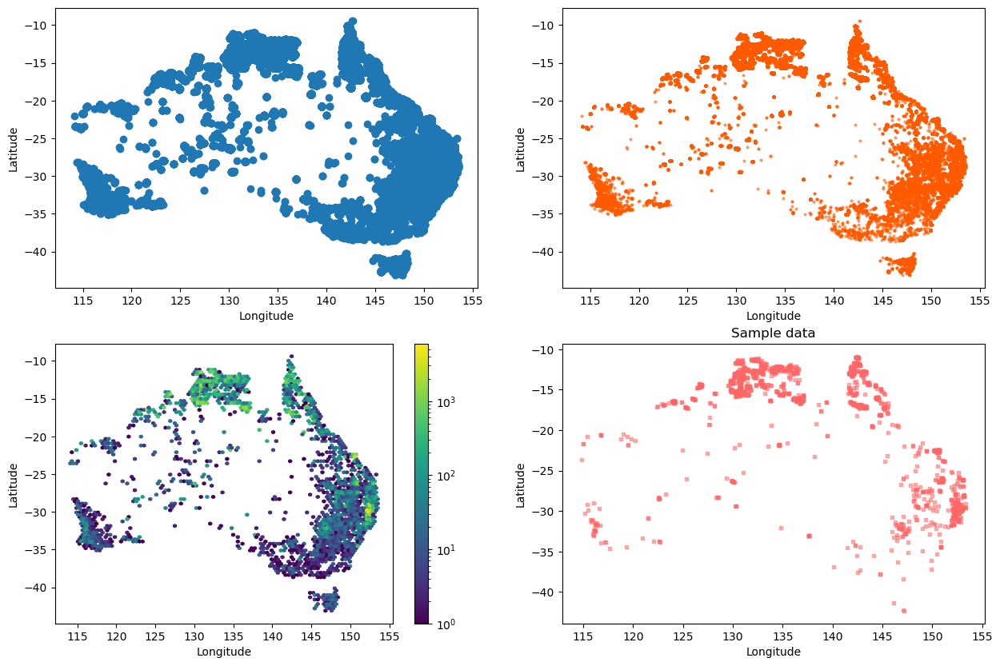

In [5]:
long = data_df.longitude
lat = data_df.latitude

xmin = min(long)
xmax = max(long)
ymin = min(lat)
ymax = max(lat)

c=data_df['bright_ti4']

plt.figure(figsize=(15,10))



ax01 = plt.subplot(2,2,1)
ax01.set_xlabel('Longitude')
ax01.set_ylabel('Latitude')
ax01.scatter(long,lat)



ax02 = plt.subplot(2,2,2)
ax02.set_xlabel('Longitude')
ax02.set_ylabel('Latitude')
ax02.scatter(long,lat,marker='p',s=5,alpha=0.5,c='#ff5a00')




ax11 = plt.subplot(2,2,3)
ax11.set_xlabel('Longitude')
ax11.set_ylabel('Latitude')
plt.hexbin(long,lat,bins='log',extent=(xmin,xmax,ymin,ymax))
plt.colorbar()



# sampaling

sample = data_df.sample(frac=0.01)

long_sample = sample.longitude
lat_sample = sample.latitude

ax11 = plt.subplot(2,2,4)
ax11.set_title("Sample data")
ax11.set_xlabel('Longitude')
ax11.set_ylabel('Latitude')
ax11.scatter(long_sample,lat_sample,marker=',',s=5,alpha=0.5,c='#ff6767')



# sample #ff6767

1.2 In what areas are most of the anomalies (measurements) located? [5pts]

In [6]:
# Most of the data is placed at south - east side 

In [7]:
fig = go.Figure(go.Densitymapbox(
    lat=data_df.latitude,
    lon=data_df.longitude,
    z=data_df['bright_ti4'],
    radius=5,
    colorscale='Reds'
))

fig.update_layout(
    mapbox_style = 'stamen-terrain',
    mapbox_center_lon=134,
    mapbox_center_lat=-25,
    mapbox_zoom=2.4
)

fig.update_layout(title = 'Australian Fires',
                  title_font = dict(size = 20,color = 'FireBrick'),
                  title_x = 0.5)

fig.show()

# Task 2
Visualize the distribution of Brightness temperature I-4 as a histogram (with appropriate
settings). Let’s assume we are certain of a fire if the value of temperature I-4 is saturated as
visible from the histogram.


###  2.1  Visualizing class membership 
2.1 Do a small multiples plot of whether the brightness is saturated, i.e. do one plot of lat vs
long for those points with brightness saturated and a separate for those who are not (within the
same figure on separate axes). You can pick any of the methods from 1.1 that you find most
suitable. Can you spot differences in the distributions? [20 pts]


<Axes: >

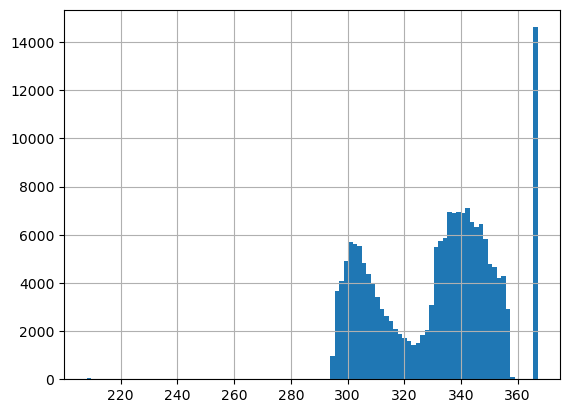

In [108]:
data_df['bright_ti4'].hist(bins=100)

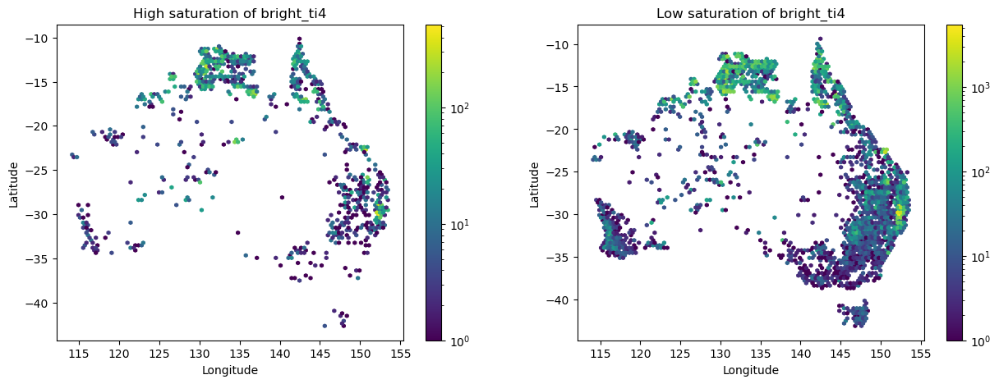

Text(0.5, 1.0, 'Unsaturated first')

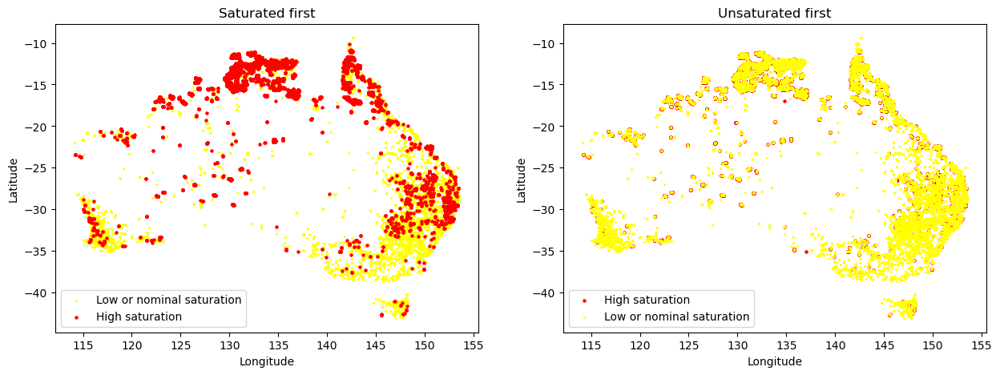

In [174]:
#2.1

max_bright_ti4 = data_df['bright_ti4'].max()
high_sat_data = data_df[data_df['bright_ti4'] >= max_bright_ti4]


long_high = high_sat_data.longitude
lat_high = high_sat_data.latitude

plt.figure(figsize=(15,5))

#high saturation
ax01 = plt.subplot(1,2,1)
ax01.set_title('High saturation of bright_ti4')
plt.hexbin(long_high,lat_high,bins='log')
ax01.set_xlabel("Longitude")
ax01.set_ylabel("Latitude")
plt.colorbar()


# for Low saturation
low_sat_data = data_df[data_df['bright_ti4'] < max_bright_ti4]

# high_sat_data
long_low = low_sat_data.longitude
lat_low = low_sat_data.latitude

#low saturation
ax11 = plt.subplot(1,2,2)
ax11.set_title('Low saturation of bright_ti4')
ax11.set_xlabel("Longitude")
ax11.set_ylabel("Latitude")
plt.hexbin(long_low,lat_low,bins='log')
plt.colorbar()

plt.show()


#----------------------------------------------------------------------------------------------------------------------------#


plt.figure(figsize=(15,5))

ax00 = plt.subplot(1, 2, 1)
ax00.scatter(long_low, lat_low, marker='*', s=2, c='yellow')
ax00.scatter(long_high, lat_high, marker='o', s=5, c='red')
ax00.set_xlabel('Longitude')
ax00.set_ylabel('Latitude')
ax00.legend(['Low or nominal saturation', 'High saturation'])
ax00.set_title('Saturated first')

ax01 = plt.subplot(1, 2, 2)
ax01.set_xlabel('Longitude')
ax01.set_ylabel('Latitude')
ax01.scatter(long_high, lat_high, marker='o', s=5, c='red')
ax01.scatter(long_low, lat_low, marker='*', c='yellow', s=2)
ax01.legend(['High saturation', 'Low or nominal saturation'])
ax01.set_title('Unsaturated first')



2.2 Plot both groups in the same axes with different colors. Try changing the order of plotting
the two classes (i.e. draw the saturated first then the non-saturated or the other way around).
Make sure to include a legend. How does that impact the result? [20 pts]

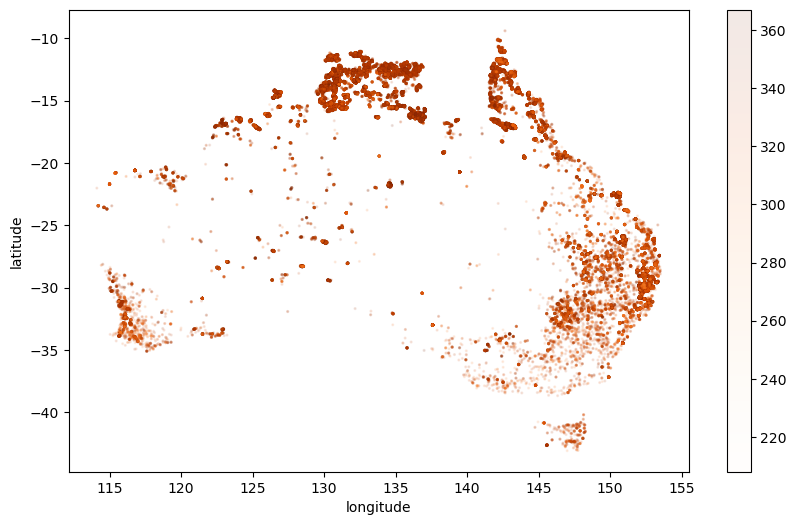

In [178]:

plt.figure(figsize=(10,6))
plt.xlabel('longitude')
plt.ylabel('latitude')
ax = plt.scatter(x='longitude',y='latitude',s=data_df['bright_ti4'] / data_df['bright_ti4'].min(),data=data_df,c='bright_ti4',alpha=0.10,cmap='Oranges')
plt.colorbar(ax)
plt.show()
